<a href="https://colab.research.google.com/github/cryingjin/Today-I-Learned/blob/master/COVID19_assignment_making.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# COVID-Clustering
앞으로 7-8월 간단한 NLP와 클러스터링, 그리고 bokeh를 통한 구현을 진행하는 것이 목표입니다. 잘되면 다른 데이터에 접목시켜보는 시간도 가져보아요 

***
## Task
- data : https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge
- 데이터는 kaggle 사이트에 올라와있는 논문 파일을 사용, 2020.07.17 기준 다운받은 ver36 데이터 13GB 줄여서 사용
- 데이터는 최신 논문만 다루는 것으로, 데이터의 갯수 3000-5000개로 줄여서 진행

***
## <span style="color:red"> Today To Do List
오늘 진행할 과제는 다음과 같습니다.
0. pickle 파일로 assignment1 데이터 불러오기
1. (stopwords 복습)
2. Tokenizing
3. Word Embedding  
  
#### <span style="color:red"> 오늘 내용은 개념적인 부분도 있고, 코드가 실행되는 동안 설명에 대해서 읽어보시는 것이 중요합니다!

***
## Ready
- 모듈 준비하기
- assignment1 파일 불러오기

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
cd /content/drive/My Drive/Daewoong

/content/drive/My Drive/Daewoong


In [4]:
# ready
import pandas as pd
import numpy as np
import glob
import json
from tqdm import tqdm
import pickle
import string

# visualize modules 
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')
sns.set_palette("hls")
import warnings
warnings.filterwarnings('ignore')
# plt.style.use('ggplot') 더 예쁜 seaborn 사용

# PCA / Clustering modules
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.manifold import TSNE

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Flow
1. Data load, EDA, Pre-Processing
2. Word Tokeninzing
3. Word Embedding
4. Dimensionality Reduction (PCA, t-SNE)
5. Clustering
6. Visualization
7. ETC

In [ ]:
# Pickle 불러오기
with open('COVID19_assignment1.pickle','rb') as fr:
    data = pickle.load(fr)
data.head()     

,paper_id,doi,abstract,body_text,publish_time,authors,title,journal,abstract_summary,abstract_word_count,body_word_count,body_unique_words
27,001c739361ad2fadb6f2d22f14dfe23e772eb5b1,10.3390/diagnostics10060399,The current coronavirus disease 2019 pandemic ...,"On 30 January 2020, the World Health Organizat...",2020-06-11,"James, Ameh S.. Alwneh, John I.",COVID-19 Infection Diagnosis: Potential<b...,Diagnostics (Basel),The current coronavirus disease 2019 pa...,1614,38904,78
31,0020e5c796f50e927b96ff0b7ea375b4745261a3,10.1186/s12887-020-02112-x,Background: One major limitation for less inva...,Respiratory Distress Syndrome (RDS) affects 85...,2020-05-08,"Chevallier, Marie. Durrmeyer, Xavier. ...",Propofol versus placebo (with rescue wi...,BMC Pediatr,Background: One major limitation for le...,286,25663,81
33,00218ecac4058261da156a6848e05e72f77b4dfc,10.1016/s2213-8587(20)30155-8,www.thelancet.com/diabetes-endocrinology Publi...,In the current coronavirus disease 2019 (COVID...,2020-05-05,"Danne, Thomas. Limbert, Catarina","COVID-19, type 1 diabetes, and technolo...",Lancet Diabetes Endocrinol,www.thelancet.com/diabetes-endocrinology<br>...,82,9270,70
34,0022361a636d679fc3493cc0b20bb6127bf63a6a,10.1016/j.matpr.2020.06.245,The novel Coronavirus disease has increased ra...,"Viruses are a submicroscopic agent, which are ...",2020-06-23,"Waleed Salehi, Ahmad. Baglat, Preety. ...",Review on Machine and Deep Learning Mo...,Mater Today Proc,The novel Coronavirus disease has incre...,1592,18769,78
37,00249bd5965a3cde520cdd0def48509c67ecf865,10.1007/978-3-030-49186-4_29,"Cancer, which involves the dysregulation of ge...","Worldwide, ovarian cancer has the worst progno...",2020-05-06,"Bhardwaj, Archana. Van Steen, Kristel",Multi-omics Data and Analytics Integrati...,Artificial Intelligence Applications and Innov...,"Cancer, which involves the dysregulation...",1026,19540,83


In [ ]:
data.shape     # (9377, 12)

(9377, 12)

## 1. Stop words 처리 복습
저번 과제에서 만든 custom_stop_words 도 5개 추가 해주세요~!

In [ ]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
import en_core_sci_lg
import string

punctuations = string.punctuation
stopwords = list(STOP_WORDS)

custom_stop_words = [
    'doi', 'preprint', 'copyright', 'peer', 'reviewed', 'org', 'https', 'et', 'al', 'author', 'figure', 
    'rights', 'reserved', 'permission', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 
    'al.', 'Elsevier', 'PMC', 'CZI', 'www'
]

for w in custom_stop_words:
    if w not in stopwords:
        stopwords.append(w)
        
stopwords

['per',
 'of',
 'further',
 'it',
 'into',
 "'m",
 'cannot',
 'together',
 'could',
 'to',
 'since',
 'your',
 '’m',
 'he',
 'amongst',
 'nowhere',
 'amount',
 'nine',
 '‘m',
 'other',
 'each',
 'move',
 'via',
 'empty',
 'therefore',
 'become',
 'than',
 'thereby',
 "'ve",
 'three',
 'former',
 'enough',
 'she',
 'mine',
 'hence',
 'be',
 'everything',
 'again',
 'hereafter',
 'did',
 'until',
 'first',
 'and',
 'above',
 'fifteen',
 'whereafter',
 'ourselves',
 'being',
 'every',
 'how',
 'i',
 'himself',
 '‘re',
 'still',
 'afterwards',
 'last',
 'always',
 'less',
 'not',
 'thereupon',
 'elsewhere',
 'ten',
 'often',
 'our',
 'well',
 'as',
 'would',
 'why',
 'had',
 'next',
 'whatever',
 'on',
 'for',
 'below',
 'made',
 'though',
 'part',
 'five',
 'indeed',
 'might',
 'among',
 'up',
 'third',
 'then',
 'alone',
 'out',
 'whereby',
 'becomes',
 "'d",
 'please',
 'us',
 'must',
 'was',
 'beyond',
 'have',
 'sometimes',
 'towards',
 'were',
 'everywhere',
 '‘s',
 'but',
 'there',


## 2. Tokenizing
다양한 영어 토크나이저 https://wikidocs.net/21698
다양한 토크나이저가 있지만 en_core_sci_lg는 바이오 논문 전용 토크나이저 입니다~  
따라서 우리 데이터에 적합하기 때문에 이것을 사용해서 토크나이징 해봅시다  

In [ ]:
# Parser : 단어 자르기
parser = en_core_sci_lg.load(disable=['tagger', 'ner'])
parser.max_length = 7000000

# 토크나이징 : 특정 조건을 기준으로 문자열 쪼갬
# 이 부분에서 stopwords 도 참고하여 사용
def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens

In [ ]:
tqdm.pandas()
data['processed_text'] = data['body_text'].progress_apply(spacy_tokenizer)

100%|██████████████████████████████████████████████████████████████████████████████| 9377/9377 [53:03<00:00,  2.95it/s]


위의 두 셀을 실행시켜 주세요~~  
넉넉하게 __1시간쯤__ 소요됩니다!  
실행시키고 돌아가는 동안 NLTK의 토크나이저 설명을 읽어 봅시다!    
우리는 Spacy를 사용했지만 NLTK 는 영어 토크나이저 중에 가장 유명한 모듈입니다!  
http://textmining.kr/?p=344

## 3. Embedding (Vectorization)
단어를 쪼갠 후에는 단어를 숫자로 만들어주는 임베딩 과정을 거칩니다~  
다양한 임베딩 기법 중에 계획서에 적어놓으셨던 __TF-IDF__ 방법을 사용해보겠습니다.  

TF_IDF(Term-Frequency-Inverse Document Frequency) 이 기법은 __특정문서에서 해당단어가 나타난 수__와 __전체 문서에서 해당 단어가 나타난 수__를 동시에 고려하는 방법입니다.  

자세한 것은 지난주에 참고자료로 드린 nlp 기초에 잘 나와있습니다!  

In [ ]:
# TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer   
def vectorize(text, maxx_features):
    
    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

In [ ]:
text = data['processed_text'].values
X = vectorize(text, 2 ** 12)
X.shape     # (9377, 4096)

(9377, 4096)

저희는 지금까지 논문 본문인 body_text 컬럼에 토크나이징과 임베딩을 진행했는데요  
(9377, 1) 차원이 토크나이징과 임베딩을 거쳐서 (9377, 4096)까지 늘어났습니다 ㅎㅎ

In [ ]:
print(X)

  (0, 1980)	0.002724345374962979
  (0, 415)	0.0030500073494089727
  (0, 3063)	0.003869749203376969
  (0, 1917)	0.004998033327895759
  (0, 3323)	0.004491419928752434
  (0, 1034)	0.002786274136792821
  (0, 1767)	0.005064181183126944
  (0, 3077)	0.004668213975304236
  (0, 2392)	0.004833821191609214
  (0, 1008)	0.003527427053168721
  (0, 930)	0.006054158403187994
  (0, 1932)	0.005099638320431024
  (0, 3764)	0.006893320513407478
  (0, 162)	0.004659711894447969
  (0, 695)	0.0032588575620248125
  (0, 2896)	0.015757494135552892
  (0, 192)	0.004740052219211341
  (0, 641)	0.0041823427442450635
  (0, 1533)	0.005303079826783193
  (0, 765)	0.003259776908781044
  (0, 3438)	0.005344035996862445
  (0, 355)	0.00242698455121615
  (0, 512)	0.005042728485812226
  (0, 2658)	0.005439175243113888
  (0, 1181)	0.005845965821823759
  :	:
  (9376, 945)	0.025978868086070552
  (9376, 928)	0.02122018376051607
  (9376, 1448)	0.020677905681602608
  (9376, 3522)	0.010511071891440406
  (9376, 500)	0.011915049507332989


모두 숫자로 변한 matrix 형태가 되었네요...  
이제 컴퓨터는 잘 읽고 사람은 읽을 수 없어요..


### _추가 임베딩 자료_ 
festtext : 
https://ratsgo.github.io/from%20frequency%20to%20semantics/2017/03/11/embedding/

## 4. Word Cloud  
(9377, 4096) 차원을 차원축소하기 전에 간단한 Word Cloud를 한번 해보도록 합시다~   
다양한 곳에서 쉽게 접할 수 있는 시각화 기법이라 친숙하실 것 같아요 :)  

Word Cloud 및 Word2Vec 참고 https://www.kaggle.com/phyothuhtet/document-clustering-self-organizing-map-kmeans  

In [ ]:
data['processed_text']

27       30 january 2020 world health organization decl...
31       respiratory distress syndrome rds affect 85 pr...
33       current coronavirus disease 2019 covid-19 cris...
34       viruses submicroscopic agent genetic substance...
37       worldwide ovarian cancer wrong prognosis high ...
                               ...                        
63763    hydroxychloroquine hcq chloroquine cq know ant...
63776    covid-19 ﻿1 recognize december 2019 month evol...
63777    health system worldwide currently face unique ...
63779    hpiv3 common cause respiratory illness infant ...
63786    emergent interdependent global system stand ke...
Name: processed_text, Length: 9377, dtype: object

__data 의 processed_text는 토크나이징까지 시킨 본문 입니다__  
위와 같은 모습이네요

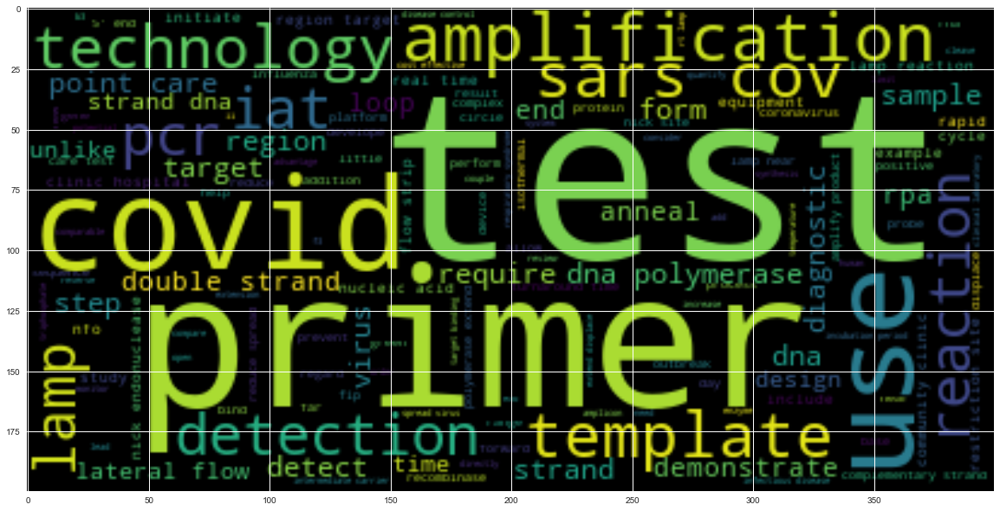

In [ ]:
# ready
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud().generate(data.iloc[0]['processed_text'])
f, ax = plt.subplots(figsize=(20, 20))     # 크기 조절
plt.imshow(wordcloud, interpolation="bilinear")    # 색상 선택

wordcloud 가 깔려있지 않으시면 __conda install -c conda-forge wordcloud__ 명령어를 아나콘다 프롬프트에서 실행시켜서 깔아주세요!

토크나이징(및 불용어 처리)한 0번째 논문의 단어를 워드 클라우드로 나타내면 위와 같습니다.  
만약 위의 단어를 보시고 필요 없는 단어들이 보이시면 앞으로 불용어 처리에서 처리해주시면 되겠죠?!  
  
__여기까지 하셨다면 여러분은 클러스터링이 아니더라도 자연어를 이용해서 워드클라우드를 만드는 방법을 배우셨습니다~!__

### <span style="color:red"> Q. 토크나이징 하지 않은 0번째 논문 본문의 워드 클라우드를 만들어주세요~  
토크나이징 안된 논문 본문은 불용어 처리가 안되어서 필요 없는 단어들도 모두 포함되어 있겠죠?! 한 번 비교해주세요~  
데이터를 충분히 이해하시고 과정을 이해하면서 따라오셨다면 하실 수 있습니다!

In [ ]:
'코드를 입력해주세요'

### <span style="color:red"> Q. 토크나이징 된 1004번째 논문 본문의 워드 클라우드를 만들어주세요~
이해하면서 따라오셨다면 하실 수 있습니다!

In [ ]:
'코드를 입력해주세요'

## Save  
중간 저장을 해줄게요 토크나이징과 임베딩까지 시간이 오래걸리셨죠?  
다음번에는 이 작업을 없이 과제를 진행할 수 있도록 pickle로 저장해주세요!  

In [ ]:
# data 데이터프레임
# pickle 저장
with open('COVID19_assignment2.pickle','wb') as fw:
    pickle.dump(data,fw)

### <span style="color:red"> Q. X를 pickle 파일로 저장하기

text = data['processed_text'].values  
X = vectorize(text, 2 ** 12)  
X.shape     # (9377, 4096)  

위에 사용한 코드에서 논문본문을 임베딩하여 processed_text 컬럼으로 만들었습니다.  
변수 이름은 X입니다. X를 pickle 파일로 저장해주세요  
이름은 'COVID19_assignment2_X.pickle'로 하겠습니다~  

In [ ]:
# pickle 저장
with open('COVID19_assignment2_X.pickle','wb') as fw:
    pickle.dump(X,fw)

# 확인해주세요!
'COVID19_assignment2.pickle' 와 'COVID19_assignment2_X.pickle' 파일 모두 저장되었는지 꼭 확인해주세요!

# * pickle 파일 불러오기
이어서함 0721  
불용어 추가 0729 -> X_0729 파일

In [5]:
# Pickle 불러오기
with open('COVID19_assignment2.pickle','rb') as fr:
    data = pickle.load(fr)
with open('COVID19_assignment2_X_0729.pickle','rb') as fr:
    X = pickle.load(fr)    

## 5. PCA & Clustering
1. PCA - 차원축소
2. K-Means
3. t-SNE - 차원축소
4. 시각화


### 5.1 PCA
차원축소  
pca 시각화 기초 https://jaehyeongan.github.io/2019/08/13/Basic-Visualization-Analytics/

In [6]:
X.shape     # 원래 X의 차원 (9377, 4096)

(9377, 4096)

In [ ]:
pca90 = PCA(n_components=0.90, random_state=42)

X_reduced_90 = pca90.fit_transform(X.toarray())     # X에 적용하여 X_reduced_90 라는 변수 만듦
X_reduced_90.shape     # (9377, 1773)

(9377, 1773)

변경 후 data 차원 확인  
(9377, 1773)
90% 설명력을 유지한채 컬럼 수 약 4000개에서 1700개로 줄어듭니다

### <span style="color:red"> Q. 80%의 설명력을 유지한 데이터로 차원을 축소해주세요! 비교해볼게요~

In [ ]:
pca80 = PCA(n_components=0.80, random_state=42)

X_reduced_80 = pca80.fit_transform(X.toarray())
X_reduced_80.shape

(9377, 1116)

In [7]:
pca_2d = PCA(n_components=2, random_state=42)      # 2차원으로 축소
X_reduced_2d = pca_2d.fit_transform(X.toarray())
X_reduced_2d.shape

(9377, 2)

### 5.2 K - Means Clustering & 시각화  
pca 가 적용된 데이터에 clustering 방법인 kmeans 알고리즘을 적용시켜 봅시다.  
위에서 만드신 80% 설명력을 가진 X_reduced_80 데이터를 사용하겠습니다!  
festtext clustering 참고 https://www.kaggle.com/adelfdelvalleperez/cord-19-fasttext-words-clustering

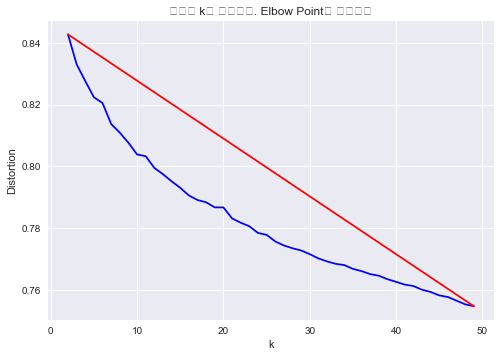

In [ ]:
# 최적의 K 찾기 : 군집 갯수 k 찾기

# K=50 개의 클러스터에 대해서 시각화
distortions = []
K = range(2, 50)
tqdm.pandas()
for k in K:
    k_means = KMeans(n_clusters=k, random_state=42).fit(X_reduced_80)
    k_means.fit(X_reduced_80)
    distortions.append(sum(np.min(cdist(X_reduced_80, k_means.cluster_centers_, 'euclidean'), axis=1)) / X_reduced_80.shape[0])
    #print('Found distortion for {} clusters'.format(k))

# Visualization
X_line = [K[0], K[-1]]
Y_line = [distortions[0], distortions[-1]]

# Plot the elbow
plt.plot(K, distortions, 'b-')
plt.plot(X_line, Y_line, 'r')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('최적의 k는 어디일까. Elbow Point를 찾아보자')
plt.show()

안타깝게도 k를 찾는 것은 몇 시간 정도 걸렸습니다..   
데이터가 많은데 for 문이 계속 돌면서 최적의 값을 찾기 때문인데요...  
여러분은 돌리지 마시고 이렇게 찾는 구나~ 하고 아시기만 하셔도 됩니다.  
k를 찾을 때는 위의 코드를 사용하시면 되니, 다른 데이터를 분석하실 때 그대로 써주세요  
열심히 찾은 결과 __k=20__ 정도로 설정하면 될 것 같습니다.

In [ ]:
'''
# DBSCAN 밀도기반 0729
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps=0.3, min_samples=10)
y_pred = dbs.fit_predict(X_reduced_80)
y_pred
'''

array([-1, -1, -1, ..., -1, -1, -1])

In [ ]:
k = 20
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced_80)
y_pred

array([ 2,  7,  9, ..., 11, 16,  9], dtype=int32)

In [ ]:
# 저장
data['y'] = y_pred

위와 같이 클러스터링을 하는 코드는 몇줄이면 됩니다.  
먼저 k의 갯수를 설정해주고  KMeans라는 모델을 간편하게 kmeans라고 부르겠다고 설정했습니다.  이때 클러스터의 갯수는 k, random_state=42로 설정했습니다.  이 부분은 자유롭게 바꾸시면 되는데 설명이 필요하시면 말해주세요!  

__y_pred__는 kmeans 를 'X_reduced_80'변수에 적용했을 때 예측되는 값 입니다

In [ ]:
len(y_pred)

9377

y_pred의 길이를 찍어보면 9377 입니다. 아까 X_reduced_80변수의 차원이 (9377, 1116) 였죠?!  
y_pred는 9377개의 데이터를 15가지(k개)의 클래스로 나눠서 분류해놨을 겁니다! 

In [8]:
# 0729 PCA로 2d 축소
k = 20
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced_2d)
y_pred

array([ 9,  5, 19, ..., 16,  1, 12], dtype=int32)

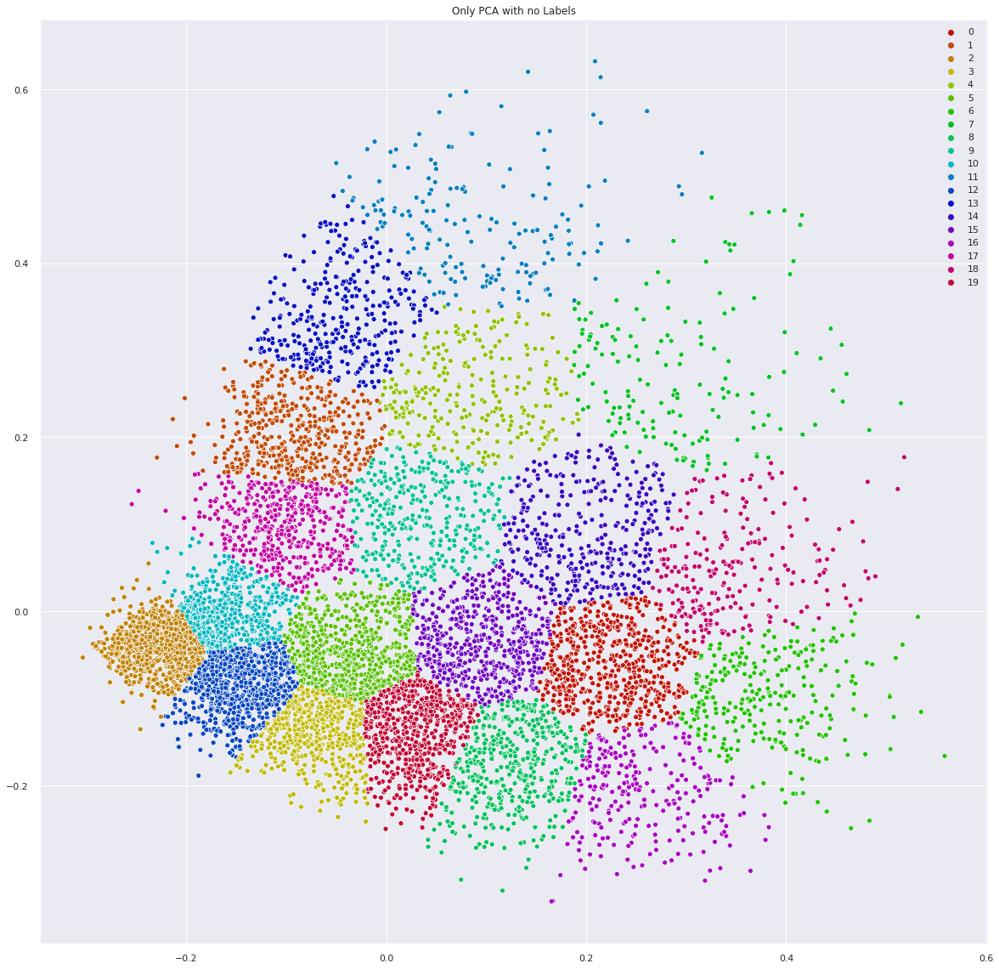

In [10]:
# 2d pca 시각화
# sns settings
sns.set(rc={'figure.figsize':(20,20)})

# colors
palette = sns.hls_palette(20, l=.4, s=.9)      # 20개의 클러스터별로 색깔 칠하기

# plot
sns.scatterplot(X_reduced_2d[:,0], X_reduced_2d[:,1],hue=y_pred, palette=palette)
plt.title('Only PCA with no Labels')
plt.savefig("PCA2d_covid19.png")
plt.show()

0729  
군집도 이상, 색 그냥 칠해놓은듯 

### 5.3 t-SNE 차원축소  
pca 도 차원축소 방법이고 t-SNE도 차원축소 방법입니다.  
우리는 pca를 통해 차원을 축소했지만 t-SNE 방법을 이용해서 2D로 바꾸고 다시한번 시각화해보겠습니다.

__t-SNE 함수 설명__  
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html  
perplexityfloat, optional (default: 30)
The perplexity is related to the number of nearest neighbors that is used in other manifold learning algorithms. Larger datasets usually require a larger perplexity. Consider selecting a value between 5 and 50. Different values can result in significanlty different results.

In [ ]:
# t-SNE 로 2D 까지 차원 축소! # n_components = 2 가 디폴트
tsne = TSNE(verbose=1, perplexity=100, random_state=42)     # perplexity : 유사정도
X_embedded = tsne.fit_transform(X.toarray())
X_embedded.shape

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 9377 samples in 8.013s...
[t-SNE] Computed neighbors for 9377 samples in 850.102s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9377
[t-SNE] Computed conditional probabilities for sample 2000 / 9377
[t-SNE] Computed conditional probabilities for sample 3000 / 9377
[t-SNE] Computed conditional probabilities for sample 4000 / 9377
[t-SNE] Computed conditional probabilities for sample 5000 / 9377
[t-SNE] Computed conditional probabilities for sample 6000 / 9377
[t-SNE] Computed conditional probabilities for sample 7000 / 9377
[t-SNE] Computed conditional probabilities for sample 8000 / 9377
[t-SNE] Computed conditional probabilities for sample 9000 / 9377
[t-SNE] Computed conditional probabilities for sample 9377 / 9377
[t-SNE] Mean sigma: 0.348790
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.985649
[t-SNE] KL divergence after 1000 iterations: 1.764230


(9377, 2)

(9377, 2) 차원의 2차원 형태가 되었습니다! 이제 클러스터링을 시각화해볼게요

DBSCAN - t-sne - 시각화 0728

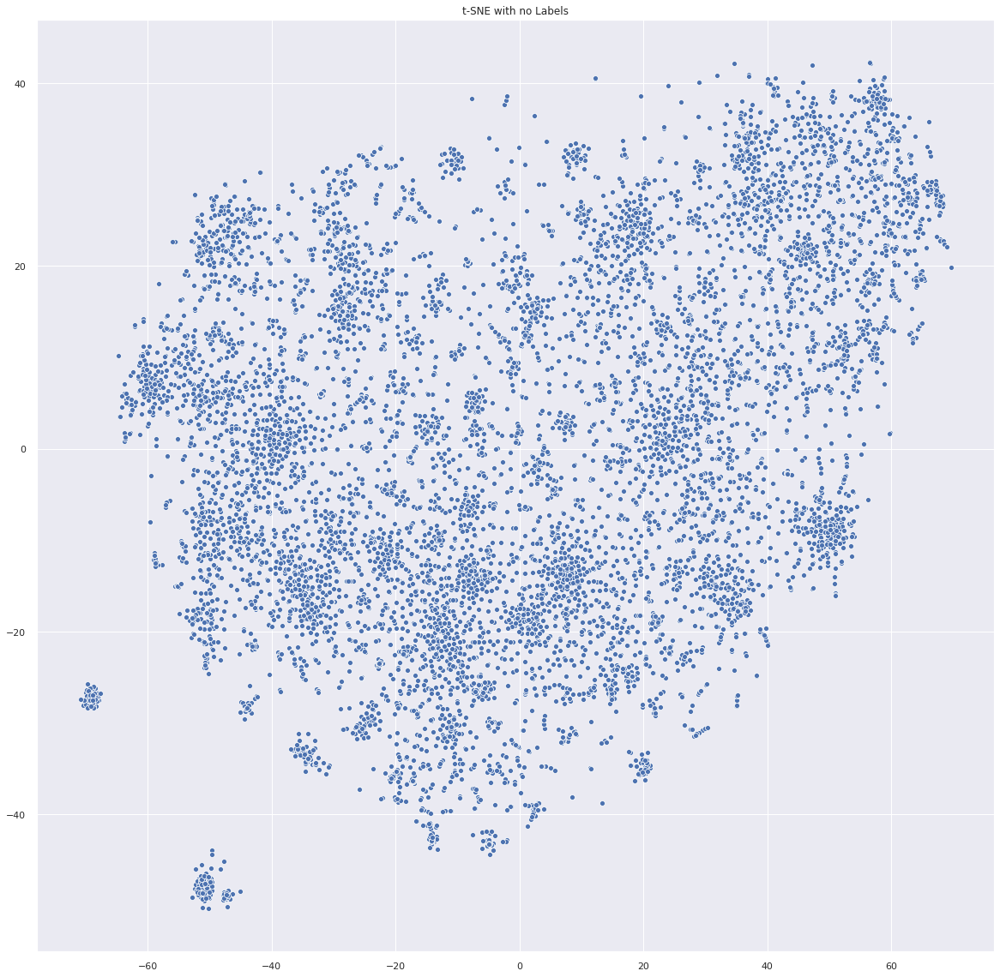

In [ ]:
# sns settings
sns.set(rc={'figure.figsize':(20,20)})

# colors
palette = sns.color_palette("bright", 1)

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], palette=palette)
plt.title('t-SNE with no Labels')
plt.savefig("t-sne_covid19.png")
plt.show()

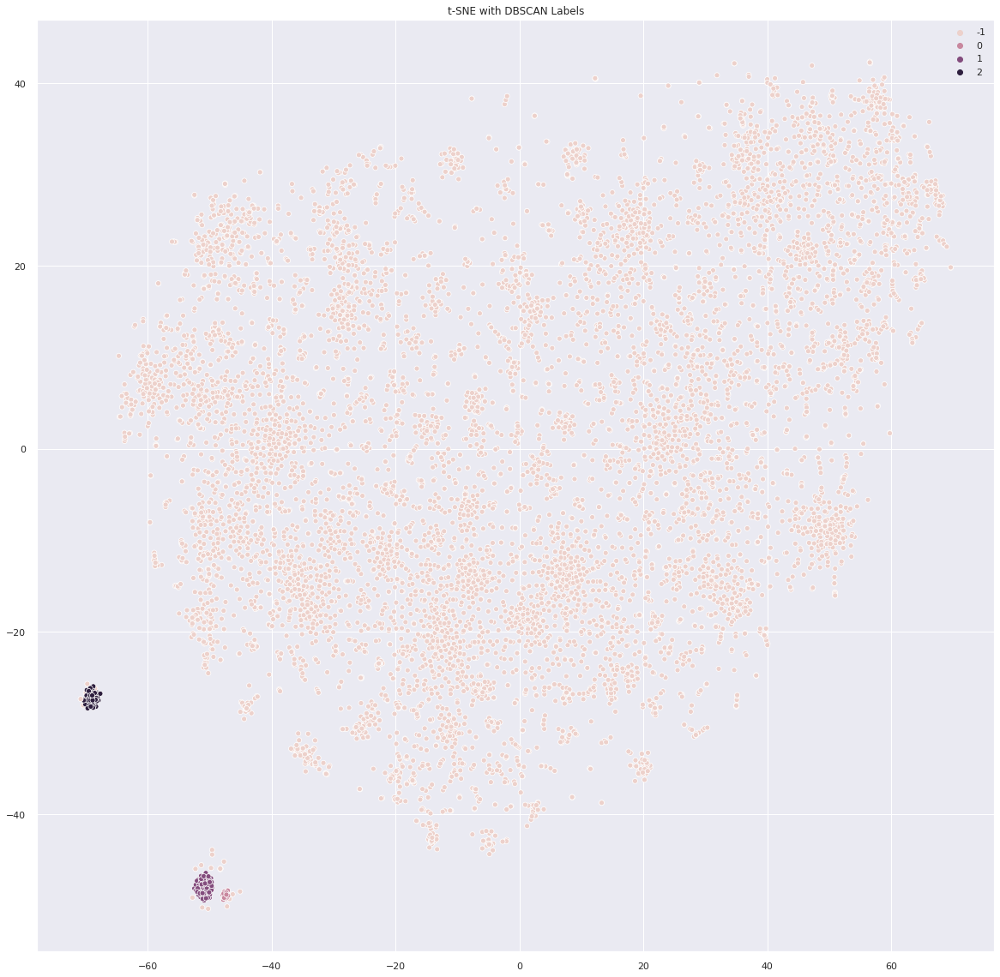

In [ ]:
# DBSCAN 으로 시각화
%matplotlib inline

# sns settings
sns.set(rc={'figure.figsize':(20,20)})

# colors
#palette = sns.hls_palette(20, l=.4, s=.9)      # 20개의 클러스터별로 색깔 칠하기

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full')     # y_pred : kmeans로 예측
plt.title('t-SNE with DBSCAN Labels')
plt.savefig("improved_cluster_tsne_DBSCAN.png")
plt.show()

밀도기반 DBSCAN 은 완전 못 잡아냄....

In [ ]:
# t-sne 3차원
tsne = TSNE(verbose=1, perplexity=100, random_state=42, n_components=3)     # perplexity : 유사정도
X_embedded = tsne.fit_transform(X.toarray())
X_embedded.shape

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 9377 samples in 8.038s...
[t-SNE] Computed neighbors for 9377 samples in 849.511s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9377
[t-SNE] Computed conditional probabilities for sample 2000 / 9377
[t-SNE] Computed conditional probabilities for sample 3000 / 9377
[t-SNE] Computed conditional probabilities for sample 4000 / 9377
[t-SNE] Computed conditional probabilities for sample 5000 / 9377
[t-SNE] Computed conditional probabilities for sample 6000 / 9377
[t-SNE] Computed conditional probabilities for sample 7000 / 9377
[t-SNE] Computed conditional probabilities for sample 8000 / 9377
[t-SNE] Computed conditional probabilities for sample 9000 / 9377
[t-SNE] Computed conditional probabilities for sample 9377 / 9377
[t-SNE] Mean sigma: 0.348790
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.018631
[t-SNE] KL divergence after 1000 iterations: 1.642049


(9377, 3)

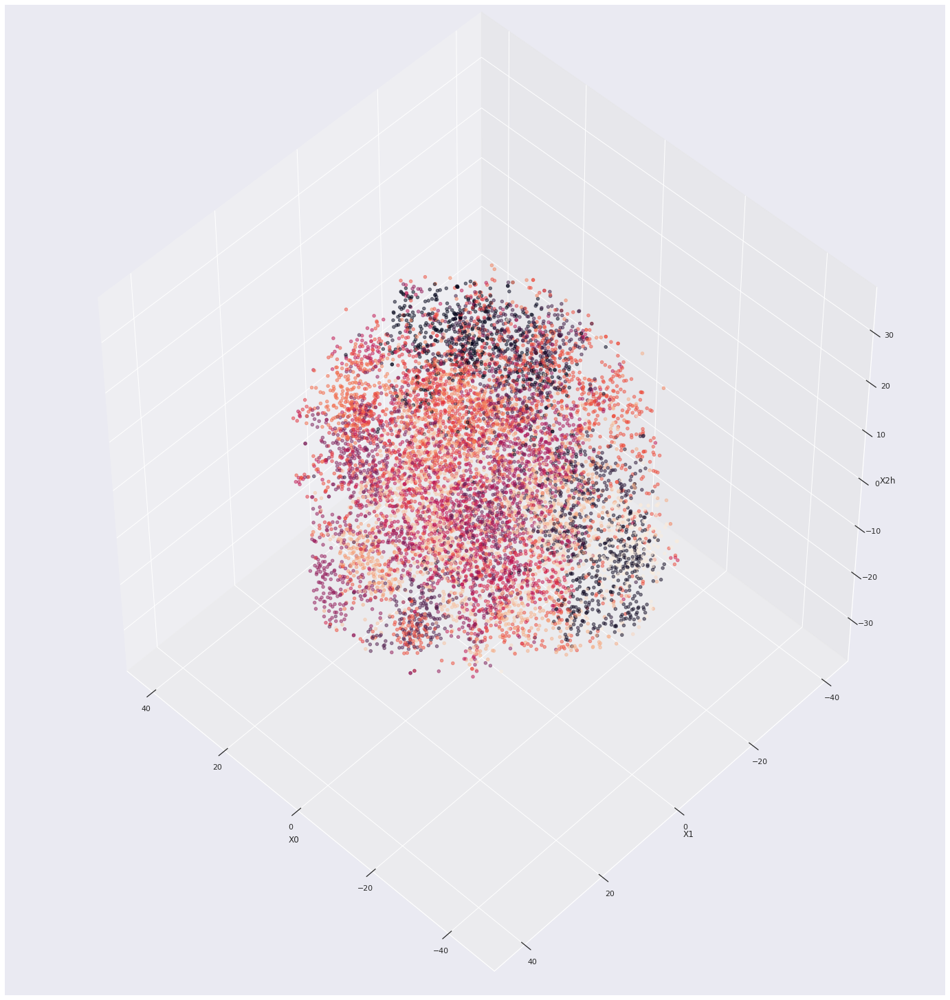

In [ ]:
# 3d 시각화
from mpl_toolkits.mplot3d import Axes3D
# scatter plot
fig = plt.figure( figsize=(20,20))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
ax.scatter(X_embedded[:,0],X_embedded[:,1],X_embedded[:,2],c=y_pred,alpha=0.5)
ax.set_xlabel('X0')
ax.set_ylabel('X1')
ax.set_zlabel('X2')
plt.show()


### 5.4 최종 시각화
y_pred : kmeans로 예측





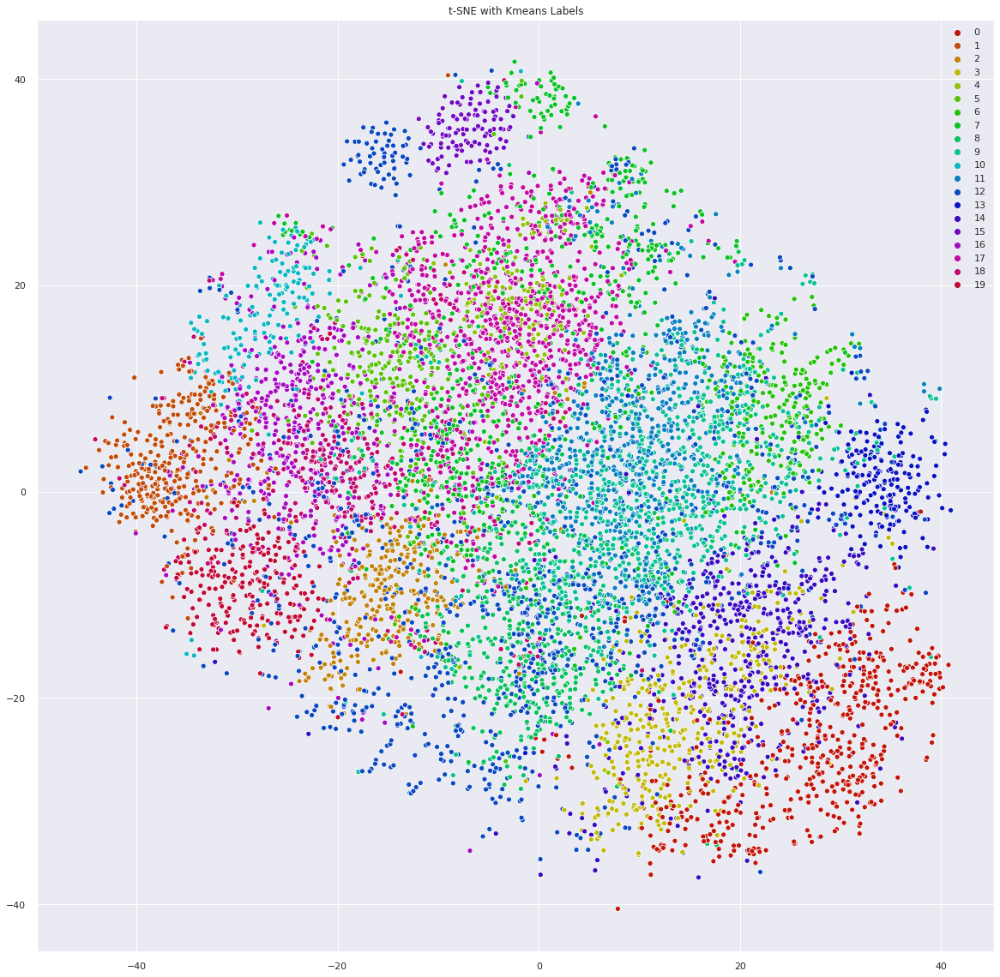

In [ ]:
%matplotlib inline

# sns settings
sns.set(rc={'figure.figsize':(20,20)})

# colors
palette = sns.hls_palette(20, l=.4, s=.9)      # 20개의 클러스터별로 색깔 칠하기

# plot
sns.scatterplot(X_embedded[:,0], X_embedded[:,1], hue=y_pred, legend='full', palette=palette)     # y_pred : kmeans로 예측
plt.title('t-SNE with Kmeans Labels')
plt.savefig("improved_cluster_tsne.png")
plt.show()

현재 파일을 만드신 폴더에 sne_covid19.png 파일과 improved_cluster_tsne.png 파일이 만들어지셨는지 확인해주세요!

*** 
# 다시
이 아래로 복붙함,
 6. Topic Modeling & 7.Plotting with boket 공부하기  
*** 

## 6. Topic Modeling on Each Cluster
## 잠재디리클레할당(Latent Dirichlet Allocation, LDA)
각 클러스터마다 가장 의미있는 단어들만 찾아보겠습니다! 어떤 의미들로 모였는지 알 수 있겠죠!  
topic modeling 에는 LDA 를 사용합니다!  
참조 링크는 처음부터 끝까지 실습을 따라해도 좋을 것 같습니다!
ref: https://medium.com/@omicro03/%EC%9E%90%EC%97%B0%EC%96%B4%EC%B2%98%EB%A6%AC-nlp-8%EC%9D%BC%EC%B0%A8-lda-f571b4da9d04  


In [ ]:
# LDA ready
from sklearn.decomposition import LatentDirichletAllocation    # LDA
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
vectorizers = []
    
for ii in range(0, 20):
    # Creating a vectorizer
    vectorizers.append(CountVectorizer(min_df=5, max_df=0.9, stop_words='english', lowercase=True, token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}'))

In [ ]:
vectorized_data = []

for current_cluster, cvec in enumerate(vectorizers):
    try:
        vectorized_data.append(cvec.fit_transform(data.loc[data['y'] == current_cluster, 'processed_text']))
    except Exception as e:
        print("Not enough instances in cluster: " + str(current_cluster))
        vectorized_data.append(None)

In [ ]:
len(vectorized_data)    # 20개만 나옴

20

In [ ]:
# number of topics per cluster
NUM_TOPICS_PER_CLUSTER = 20

lda_models = []
for ii in range(0, 20):
    # Latent Dirichlet Allocation Model
    lda = LatentDirichletAllocation(n_components=NUM_TOPICS_PER_CLUSTER, max_iter=10, learning_method='online',verbose=False, random_state=42)
    lda_models.append(lda)
    
lda_models[0]

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=20, n_jobs=None,
                          perp_tol=0.1, random_state=42, topic_word_prior=None,
                          total_samples=1000000.0, verbose=False)

In [ ]:
clusters_lda_data = []

for current_cluster, lda in enumerate(lda_models):
    # print("Current Cluster: " + str(current_cluster))
    
    if vectorized_data[current_cluster] != None:
        clusters_lda_data.append((lda.fit_transform(vectorized_data[current_cluster])))

In [ ]:
len(clusters_lda_data)

20

In [ ]:
# Functions for printing keywords for each topic
def selected_topics(model, vectorizer, top_n=3):
    current_words = []
    keywords = []
    
    for idx, topic in enumerate(model.components_):
        words = [(vectorizer.get_feature_names()[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        for word in words:
            if word[0] not in current_words:
                keywords.append(word)
                current_words.append(word[0])
                
    keywords.sort(key = lambda x: x[1])  
    keywords.reverse()
    return_values = []
    for ii in keywords:
        return_values.append(ii[0])
    return return_values

In [ ]:
all_keywords = []
for current_vectorizer, lda in enumerate(lda_models):
    # print("Current Cluster: " + str(current_vectorizer))

    if vectorized_data[current_vectorizer] != None:
        all_keywords.append(selected_topics(lda, vectorizers[current_vectorizer]))

In [ ]:
len(all_keywords)

20

In [ ]:
# 0번 클러스터의 키워드
print(len(all_keywords[0]))      # 51개
all_keywords[0]

51


['fuzzy',
 'clause',
 'axiom',
 'approximation',
 'rule',
 'point',
 'algorithm',
 'test',
 'core',
 'formula',
 'object',
 'problem',
 'type',
 'method',
 'measure',
 'word',
 'model',
 'probability',
 'equation',
 'let',
 'variable',
 'solution',
 'state',
 'constraint',
 'proof',
 'graph',
 'language',
 'theorem',
 'net',
 'code',
 'structure',
 'transition',
 'element',
 'place',
 'string',
 'mesh',
 'operator',
 'coefficient',
 'round',
 'network',
 'category',
 'attack',
 'family',
 'del',
 'invariant',
 'key',
 'facility',
 'distance',
 'probabilistic',
 'function',
 'time']

In [ ]:
# 0번 클러스터의 0번부터 9번까지 10개 키워드만 뽑아보기
all_keywords[0][:10]

['fuzzy',
 'clause',
 'axiom',
 'approximation',
 'rule',
 'point',
 'algorithm',
 'test',
 'core',
 'formula']

In [ ]:
# 10번 클러스터, 각 클러스터마다 topic 단어의 수가 다름
print(len(all_keywords[10]))      # 22개
all_keywords[10]

22


['increase',
 'tmprss',
 'network',
 'sex',
 'effect',
 'age',
 'remodel',
 'sace',
 'fig',
 'integrin',
 'cell-cell',
 'gene',
 'high',
 'patient',
 'protein',
 'use',
 'expression',
 'variant',
 'bind',
 'lung',
 'ang',
 'diabetes']

### Save  
topics.txt 라는 파일로 각 클러스터의 단어를 저장해서 시각화에 이용하도록 합니다.

In [ ]:
# Save File
f=open('topics.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")       # 클러스터 하나마다 줄바꿈
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

### Save  
- 데이터 프레임 저장 : df_covid.p  
- t-SNE를 적용한 X_embedded 저장 : X_embedded
- kmeans 알고리즘으로 예측한 y 값 저장 : y_pred

In [ ]:
import pickle

# save the COVID-19 DataFrame, too large for github
pickle.dump(data, open("df_covid.p", "wb" ))

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded.p", "wb" ))

# save the labels generate with k-means(20)
pickle.dump(y_pred, open("y_pred.p", "wb" ))

In [ ]:
# 0721 대강 저장

# Save File
f=open('topics_0721.txt','w')

count = 0

for ii in all_keywords:

    if vectorized_data[count] != None:
        f.write(', '.join(ii) + "\n")
    else:
        f.write("Not enough instances to be determined. \n")
        f.write(', '.join(ii) + "\n")
    count += 1

f.close()

# save the COVID-19 DataFrame, too large for github
pickle.dump(data, open("df_covid_0721.p", "wb" ))

# save the final t-SNE
pickle.dump(X_embedded, open("X_embedded_0721.p", "wb" ))

# save the labels generate with k-means(20)
pickle.dump(y_pred, open("y_pred_0721.p", "wb" ))

### Classify : 복붙해서 기록은 해놓지만 필요는 없을 듯

In [ ]:
# function to print out classification model report
def classification_report(model_name, test, pred):
    from sklearn.metrics import precision_score, recall_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import f1_score
    
    print(model_name, ":\n")
    print("Accuracy Score: ", '{:,.3f}'.format(float(accuracy_score(test, pred)) * 100), "%")
    print("     Precision: ", '{:,.3f}'.format(float(precision_score(test, pred, average='macro')) * 100), "%")
    print("        Recall: ", '{:,.3f}'.format(float(recall_score(test, pred, average='macro')) * 100), "%")
    print("      F1 score: ", '{:,.3f}'.format(float(f1_score(test, pred, average='macro')) * 100), "%")

In [ ]:
from sklearn.model_selection import train_test_split

# test set size of 20% of the data and the random seed 42 <3
X_train, X_test, y_train, y_test = train_test_split(X.toarray(),y_pred, test_size=0.2, random_state=42)

print("X_train size:", len(X_train))
print("X_test size:", len(X_test), "\n")

X_train size: 7501
X_test size: 1876 



In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import SGDClassifier

# SGD instance
sgd_clf = SGDClassifier(max_iter=10000, tol=1e-3, random_state=42, n_jobs=4)
# train SGD
sgd_clf.fit(X_train, y_train)

# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_train, y_train, cv=3, n_jobs=4)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (Training Set)", y_train, sgd_pred)

Stochastic Gradient Descent Report (Training Set) :

Accuracy Score:  87.468 %
     Precision:  89.541 %
        Recall:  88.703 %
      F1 score:  89.091 %


In [ ]:
# cross validation predictions
sgd_pred = cross_val_predict(sgd_clf, X_test, y_test, cv=3, n_jobs=4)

# print out the classification report
classification_report("Stochastic Gradient Descent Report (Training Set)", y_test, sgd_pred)

Stochastic Gradient Descent Report (Training Set) :

Accuracy Score:  82.249 %
     Precision:  86.323 %
        Recall:  84.035 %
      F1 score:  84.961 %


In [ ]:
sgd_cv_score = cross_val_score(sgd_clf, X.toarray(), y_pred, cv=10)
print("Mean cv Score - SGD: {:,.3f}".format(float(sgd_cv_score.mean()) * 100), "%")

Mean cv Score - SGD: 89.314 %


## 7. Plotting the data
클러스터링한 데이터를 bokeh 를 이용해서 시각화 해주는 부분입니다.  
6번에서 만들어 놓은 topic 파일 등을 모두 사용합니다.

bokeh
https://lovit.github.io/visualization/2019/11/22/bokeh_tutorial/  
bokeh 기초 https://waterprogramming.wordpress.com/tag/bokeh/  
추가자료, pandas_bokeh https://towardsdatascience.com/beautiful-and-easy-plotting-in-python-pandas-bokeh-afa92d792167

### Ready
- path 값 설정 
- call_backs.py (bokeh 파이썬 파일)이 동일한 폴더에 있어야합니다.
- 다운받은 장소 : github.com/MaksimEkin/COVID19-Literature-Clustering/blob/master/lib/call_backs.py  

bokeh 라이브러리가 깔려있지 않다면  
conda install -c bokeh bokeh 코드를 사용해서 깔아주세요

In [ ]:
import os
# path 값 설정

main_path = os.getcwd()
lib_path = '/content/drive/My Drive/Daewoong'    # 그냥 현재 폴더로 설정
os.chdir(lib_path)

In [ ]:
# required libraries for plot
from call_backs import input_callback, selected_code  # call_backs.py 불러오기
                                                      
import bokeh
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper, CustomJS, Slider, TapTool, TextInput
from bokeh.palettes import Category20
from bokeh.transform import linear_cmap, transform
from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import RadioButtonGroup, TextInput, Div, Paragraph
from bokeh.layouts import column, widgetbox, row, layout
from bokeh.layouts import column

In [ ]:
# Load the keywords per Cluster
# 클러스터당 키워드들 topics.txt 파일에서 가져오기 -> topics

topic_path = 'topics.txt'
with open(topic_path) as f:
    topics = f.readlines()

In [ ]:
topics     # 확인

['fuzzy, clause, axiom, approximation, rule, point, algorithm, test, core, formula, object, problem, type, method, measure, word, model, probability, equation, let, variable, solution, state, constraint, proof, graph, language, theorem, net, code, structure, transition, element, place, string, mesh, operator, coefficient, round, network, category, attack, family, del, invariant, key, facility, distance, probabilistic, function, time\n',
 'drug, interaction, sars-cov-, epitope, antibody, rbd, ace, vaccine, rna, peptide, acid, heparin, catalytic, cdk, library, compound, mimicry, mimic, mimick, spike, residue, amino, model, nsp, site, mutation, complex\n',
 'study, rna, viral, primer, pool, peptide, display, grant, author, group, prevalence, protein, swab, iga, surface, spot, -specific, treatment, serum, resident, dry, bacterium, blood, tcid, bronchus, block, cpe, pulmonary, locus, mismatch, cas, specimen, antibody, igg, pair, assay, patient, dna, case, detection, reaction, infection, cov

### bokeh 설정 시작

In [ ]:
y_pred

array([ 2,  7,  9, ..., 11, 16,  9], dtype=int32)

In [ ]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



In [ ]:
# Set up

# show on notebook
output_notebook()

# target labels
y_labels = y_pred

# data sources -> df말고 data로 바꿈 0721
# data 정보
source = ColumnDataSource(data=dict(
    x= X_embedded[:,0], 
    y= X_embedded[:,1],
    x_backup = X_embedded[:,0],
    y_backup = X_embedded[:,1],
    desc= y_labels, 
    titles= data['title'],
    authors = data['authors'],
    journal = data['journal'],
    abstract = data['abstract_summary'],
    labels = ["C-" + str(x) for x in y_labels],
    links = data['doi']
    ))

# 마우스 설정 : hover over
# 제목, 저자, 저널, 초록, 링크가 보이도록 설정
hover = HoverTool(tooltips=[
    ("Title", "@titles{safe}"),
    ("Author(s)", "@authors{safe}"),
    ("Journal", "@journal"),
    ("Abstract", "@abstract{safe}"),
    ("Link", "@links")
],
point_policy="follow_mouse")

# map colors : 색상설정
mapper = linear_cmap(field_name='desc', 
                     palette=Category20[20],
                     low=min(y_labels) ,high=max(y_labels))

# prepare the figure : 도구 설정
plot = figure(plot_width=1200, plot_height=850, 
           tools=[hover, 'pan', 'wheel_zoom', 'box_zoom', 'reset', 'save', 'tap'], 
           title="Clustering of the COVID-19 Literature with t-SNE and K-Means",    
           toolbar_location="above")      # 한글이 깨져서 title을 영어로 씀

# plot settings
plot.scatter('x', 'y', size=5, 
          source=source,
          fill_color=mapper,
          line_alpha=0.3,
          line_color="black",
          legend_label = 'labels')     # legend - 0721 수정
plot.legend.background_fill_alpha = 0.6

In [ ]:
# Widgets

# Keywords
text_banner = Paragraph(text= 'Keywords: Slide to specific cluster to see the keywords.', height=45)
input_callback_1 = input_callback(plot, source, text_banner, topics)

# currently selected article
div_curr = Div(text="""Click on a plot to see the link to the article.""",height=150)
callback_selected = CustomJS(args=dict(source=source, current_selection=div_curr), code=selected_code())
taptool = plot.select(type=TapTool)
taptool.callback = callback_selected

# WIDGETS
slider = Slider(start=0, end=20, value=20, step=1, title="Cluster #", callback=input_callback_1)
keyword = TextInput(title="Search:", callback=input_callback_1)

# pass call back arguments
input_callback_1.args["text"] = keyword
input_callback_1.args["slider"] = slider


In [ ]:
# Style
slider.sizing_mode = "stretch_width"
slider.margin=15

keyword.sizing_mode = "scale_both"
keyword.margin=15

div_curr.style={'color': '#BF0A30', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
div_curr.sizing_mode = "scale_both"
div_curr.margin = 20

text_banner.style={'color': '#0269A4', 'font-family': 'Helvetica Neue, Helvetica, Arial, sans-serif;', 'font-size': '1.1em'}
text_banner.sizing_mode = "scale_both"
text_banner.margin = 20

plot.sizing_mode = "scale_both"
plot.margin = 5

r = row(div_curr,text_banner)
r.sizing_mode = "stretch_width"

In [ ]:
# Show
# LAYOUT OF THE PAGE
l = layout([
    [slider, keyword],
    [text_banner],
    [div_curr],
    [plot],
])
l.sizing_mode = "scale_both"

# show
output_file('t-sne_covid-19_interactive.html')
show(l)